In [ ]:
import os
import zipfile
import subprocess
from pathlib import Path
import random
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from tqdm.auto import tqdm

from PIL import Image
import pandas as pd
from collections import Counter
import re

import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, random_split
from torch.nn.utils.rnn import pad_sequence
from torchvision.models import ResNet101_Weights

from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

# Download dataset

In [ ]:
def download_flickr8k(kaggle_dataset='adityajn105/flickr8k', download_path='data/Flickr8k'):
    """
    Downloads the Flickr8k dataset using Kaggle CLI or API.
    Compatible with both notebooks (.ipynb) and scripts (.py).
    """
    os.makedirs(download_path, exist_ok=True)
    zip_path = os.path.join(download_path, 'flickr8k.zip')

    # Check if dataset already downloaded
    if any(f.endswith(".txt") for f in os.listdir(download_path)):
        print("Flickr8k dataset already exists.")
        return

    try:
        # Try using Kaggle CLI
        subprocess.run(
            ['kaggle', 'datasets', 'download', '-d', kaggle_dataset, '-p', download_path, '--force'],
            check=True
        )
        print("Download complete via Kaggle CLI.")
    except Exception as e:
        print(f"Kaggle CLI failed: {e}\nTrying Kaggle API...")

        try:
            from kaggle.api.kaggle_api_extended import KaggleApi
            api = KaggleApi()
            api.authenticate()
            api.dataset_download_files(kaggle_dataset, path=download_path, unzip=False)
            print("Download complete via Kaggle API.")
        except Exception as e_api:
            print("Kaggle API failed:", e_api)
            raise RuntimeError("Failed to download dataset. Ensure Kaggle is properly set up.")

    # Unzipping the dataset
    zip_files = [f for f in os.listdir(download_path) if f.endswith('.zip')]
    for file in zip_files:
        zip_path = os.path.join(download_path, file)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(download_path)
        print(f"Extracted {file}")


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
download_flickr8k(kaggle_dataset='adityajn105/flickr8k', download_path='data/Flickr8k')

Download complete via Kaggle CLI.
Extracted flickr8k.zip


# Define Vocabulary


In [ ]:
class Vocabulary:
    def __init__(self, freq_threshold=5):
        self.freq_threshold = freq_threshold
        self.itos = {0: "<PAD>", 1: "<START>", 2: "<END>", 3: "<UNK>"}
        self.stoi = {v: k for k, v in self.itos.items()}

    def __len__(self):
        return len(self.itos)

    def tokenizer(self, text):
        text = text.lower()
        text = re.sub(r"[^a-z0-9]+", " ", text)
        return text.strip().split()

    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            tokens = self.tokenizer(sentence)
            frequencies.update(tokens)

        for word, freq in frequencies.items():
            if freq >= self.freq_threshold:
                self.stoi[word] = idx
                self.itos[idx] = word
                idx += 1

    def numericalize(self, text):
        tokenized = self.tokenizer(text)
        return [
            self.stoi.get(token, self.stoi["<UNK>"])
            for token in tokenized
        ]


In [ ]:
class Flickr8kDataset(Dataset):
    def __init__(self, captions_file, images_dir, vocabulary, transform=None, max_length=50):
        self.df = pd.read_csv(captions_file)
        self.images_dir = images_dir
        self.transform = transform
        self.vocab = vocabulary
        self.max_length = max_length

        # Build vocabulary
        self.vocab.build_vocab(self.df['caption'].tolist())

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        caption = self.df.iloc[idx, 1]
        img_id = self.df.iloc[idx, 0]
        img_path = os.path.join(self.images_dir, img_id)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        caption_tokens = [self.vocab.stoi["<START>"]]
        caption_tokens += self.vocab.numericalize(caption)
        caption_tokens += [self.vocab.stoi["<END>"]]

        caption_tensor = torch.tensor(caption_tokens[:self.max_length], dtype=torch.long)

        return image, caption_tensor


# Define Encoder & Decoder

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self, encoded_image_size=14, fine_tune_cnn=False):
        super(EncoderCNN, self).__init__()
        self.enc_image_size = encoded_image_size

        resnet = models.resnet101(weights=ResNet101_Weights.DEFAULT)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))
        self.fine_tune(fine_tune_cnn)

    def forward(self, images):
        features = self.resnet(images)
        features = self.adaptive_pool(features)
        return features  # shape: (batch_size, 2048, 14, 14)

    def fine_tune(self, fine_tune=True):
        for p in self.resnet.parameters():
            p.requires_grad = False
        for c in list(self.resnet.children())[5:]:
            for p in c.parameters():
                p.requires_grad = fine_tune

    def save(self, path):
        torch.save(self.state_dict(), path)
        print(f"Encoder saved to {path}")

    def load(self, path, device='cuda'):
        self.load_state_dict(torch.load(path, map_location=device))
        print(f"Encoder loaded from {path}")


In [ ]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  # Linear layer to transform encoder output
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  # Linear layer to transform decoder output
        self.full_att = nn.Linear(attention_dim, 1)  # Linear layer to calculate attention scores
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)  # Softmax layer to calculate weights

    def forward(self, encoder_out, decoder_hidden):
        att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
        att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)
        return attention_weighted_encoding, alpha


In [ ]:
class DecoderRNN(nn.Module):
    def __init__(
        self,
        embed_dim,
        decoder_dim,
        vocab_size,
        encoder_dim=2048,
        attention_dim=512,
        dropout=0.5,
        use_attention=True
    ):
        super(DecoderRNN, self).__init__()
        self.encoder_dim = encoder_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout
        self.use_attention = use_attention

        # Attention layer (optional)
        if self.use_attention:
            self.attention = Attention(encoder_dim, decoder_dim, attention_dim)

        # Embedding + LSTM core
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout_layer = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(
            embed_dim + (encoder_dim if use_attention else 0), decoder_dim, bias=True
        )

        # Init hidden/cell states
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)

        # Gating scalar for attention
        if self.use_attention:
            self.f_beta = nn.Linear(decoder_dim, encoder_dim)
            self.sigmoid = nn.Sigmoid()

        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.init_weights()

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def init_hidden_state(self, encoder_out):
        h = self.init_h(encoder_out)
        c = self.init_c(encoder_out)
        return h, c


    def forward(self, encoder_out, encoded_captions, caption_lengths, teacher_forcing=False):
        batch_size = encoder_out.size(0)
        # encoder_dim = encoder_out.size(1) if not self.use_attention else encoder_out.size(-1)
        encoder_dim = self.encoder_dim
        vocab_size = self.vocab_size

        # ---------------- Sorting ----------------
        caption_lengths, sort_ind = caption_lengths.squeeze(1).sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]

        # ---------------- Attention vs. No-Attention ----------------
        if self.use_attention:
            encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (B, num_pixels, 2048)
            num_pixels = encoder_out.size(1)
            h, c = self.init_hidden_state(encoder_out.mean(dim=1))       # (B, 2048)
        else:
            # encoder_out shape is (B, 2048, H, W)
            mean_encoder_out = encoder_out.mean(dim=[2, 3])              # (B, 2048)
            h, c = self.init_hidden_state(mean_encoder_out)

        # ---------------- Embedding ----------------
        embeddings = self.embedding(encoded_captions)
        decode_lengths = (caption_lengths - 1).tolist()

        max_decode_len = max(decode_lengths)

        predictions = torch.zeros(batch_size, max_decode_len, vocab_size).to(encoder_out.device)
        alphas = None
        if self.use_attention:
            alphas = torch.zeros(batch_size, max_decode_len, encoder_out.size(1)).to(encoder_out.device)

        prev_words = embeddings[:, 0, :]  # Start with <START> embedding

        # ---------------- Decoding ----------------
        for t in range(max_decode_len):
            batch_size_t = sum([l > t for l in decode_lengths])

            if teacher_forcing:
                emb_t = embeddings[:batch_size_t, t, :]
            else:
                if t == 0:
                    emb_t = prev_words[:batch_size_t]
                else:
                    prev_tokens = predictions[:batch_size_t, t - 1, :].argmax(dim=1)  # (B,)
                    emb_t = self.embedding(prev_tokens)  # (B, embed_dim)

            # emb_t = embeddings[:batch_size_t, t, :]

            if self.use_attention:
                attn_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t], h[:batch_size_t])
                gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
                attn_weighted_encoding = gate * attn_weighted_encoding
                lstm_input = torch.cat([emb_t, attn_weighted_encoding], dim=1)
            else:
                lstm_input = emb_t

            h, c = self.decode_step(lstm_input, (h[:batch_size_t], c[:batch_size_t]))
            preds = self.fc(self.dropout_layer(h))

            predictions[:batch_size_t, t, :] = preds
            if self.use_attention:
                alphas[:batch_size_t, t, :] = alpha

        if self.use_attention:
            return predictions, encoded_captions, decode_lengths, alphas, sort_ind
        else:
            return predictions, encoded_captions, decode_lengths, None, sort_ind



    def save(self, path):
        torch.save(self.state_dict(), path)
        print(f"Decoder saved to {path}")

    def load(self, path, device='cuda'):
        self.load_state_dict(torch.load(path, map_location=device))
        print(f"Decoder loaded from {path}")


In [ ]:
def print_model_param_counts(model, name="Model"):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params

    print(f"{name} Parameters:")
    print(f"Total:       {total_params:,}")
    print(f"Trainable:   {trainable_params:,}")
    print(f"Frozen:      {frozen_params:,}")
    print("-" * 40)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


# Decoder Approaches

In [ ]:
def greedy_decode(encoder, decoder, image, vocab, max_length=20, device='cuda'):
    decoder.eval()
    encoder.eval()

    with torch.no_grad():
        # Encode image
        encoder_out = encoder(image.unsqueeze(0).to(device))  # (1, 2048, 14, 14) if no attention, or (1, num_pixels, 2048) if attention

        # Init hidden states
        if decoder.use_attention:
             # If using attention, the encoder_out is (1, num_pixels, 2048)
             # init_hidden_state expects (B, num_pixels, 2048) but takes mean inside
             h, c = decoder.init_hidden_state(encoder_out) # Pass as is, init_hidden_state handles mean
        else:
             # If not using attention, encoder_out is (1, 2048, H, W).
             # Average spatially to get (1, 2048) before passing to init_hidden_state
             mean_encoder_out = encoder_out.mean(dim=[2, 3]) # (1, 2048)
             h, c = decoder.init_hidden_state(mean_encoder_out)


        # First input = <START>
        word = torch.tensor([vocab.stoi['<START>']]).to(device)
        embeddings = decoder.embedding(word).unsqueeze(0)  # (1, 1, embed_dim)

        seq = []

        for _ in range(max_length):
            if decoder.use_attention:
                # encoder_out here is (1, num_pixels, 2048)
                attn_weighted, _ = decoder.attention(encoder_out, h)
                gate = decoder.sigmoid(decoder.f_beta(h))
                attn_weighted = gate * attn_weighted
                lstm_input = torch.cat([embeddings.squeeze(1), attn_weighted], dim=1)
            else:
                # No attention, LSTM input is just embeddings
                lstm_input = embeddings.squeeze(1) # (1, embed_dim)


            h, c = decoder.decode_step(lstm_input, (h, c))
            preds = decoder.fc(h)
            predicted = preds.argmax(1)
            if predicted.item() == vocab.stoi['<END>']:
                break

            seq.append(predicted.item())
            embeddings = decoder.embedding(predicted).unsqueeze(0) # Prepare embedding for next step

        return [vocab.itos[idx] for idx in seq]

In [ ]:
def beam_search_decode(encoder, decoder, image, vocab, beam_size=2, max_length=20, device='cuda'):
    decoder.eval()
    encoder.eval()

    with torch.no_grad():
        k = beam_size
        vocab_size = len(vocab)

        # Encode image
        encoder_out = encoder(image.unsqueeze(0).to(device))  # (1, C, H, W) or (1, num_pixels, 2048)
        if decoder.use_attention:
            encoder_out = encoder_out.view(1, -1, decoder.encoder_dim)
            num_pixels = encoder_out.size(1)
            encoder_out = encoder_out.expand(k, num_pixels, decoder.encoder_dim)
        else:
            encoder_out = encoder_out.expand(k, *encoder_out.shape[1:])

        # Init hidden state
        h, c = decoder.init_hidden_state(
            encoder_out.mean(dim=1) if decoder.use_attention else encoder_out.mean(dim=[2, 3])
        )

        # Start decoding
        seqs = torch.LongTensor([[vocab.stoi['<START>']]] * k).to(device)
        top_k_scores = torch.zeros(k, 1).to(device)

        complete_seqs = []
        complete_seqs_scores = []

        step = 1
        while True:
            embeddings = decoder.embedding(seqs[:, -1])  # (k, embed_dim)

            if decoder.use_attention:
                attn_weighted, _ = decoder.attention(encoder_out, h)
                gate = decoder.sigmoid(decoder.f_beta(h))
                attn_weighted = gate * attn_weighted
                lstm_input = torch.cat([embeddings, attn_weighted], dim=1)
            else:
                lstm_input = embeddings

            h, c = decoder.decode_step(lstm_input, (h, c))
            scores = decoder.fc(h)  # (k, vocab_size)
            scores = torch.log_softmax(scores, dim=1)  # log probabilities
            scores = top_k_scores.expand_as(scores) + scores  # add accumulated scores

            # Get top k scores and words
            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)
            else:
                top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)

            prev_word_inds = top_k_words // vocab_size  # which sequence
            next_word_inds = top_k_words % vocab_size   # next word

            # Append new words to sequences
            seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)

            # Identify completed sequences
            incomplete_inds = [ind for ind, word in enumerate(next_word_inds) if word != vocab.stoi['<END>']]
            complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

            # Store completed sequences
            if len(complete_inds) > 0:
                complete_seqs.extend(seqs[complete_inds].tolist())
                complete_seqs_scores.extend(top_k_scores[complete_inds].tolist())

            # Stop if all sequences are complete or max length is reached
            k -= len(complete_inds)
            if k == 0 or step >= max_length:
                break

            # Prepare next step
            seqs = seqs[incomplete_inds]
            h = h[prev_word_inds[incomplete_inds]]
            c = c[prev_word_inds[incomplete_inds]]
            encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
            top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
            step += 1

        # Choose best sequence
        if len(complete_seqs) > 0:
            best_seq_idx = complete_seqs_scores.index(max(complete_seqs_scores))
            best_seq = complete_seqs[best_seq_idx]
        else:
            best_seq = seqs[0].tolist()  # fallback: first incomplete sequence

        # Convert token IDs to words
        return [
            vocab.itos[idx]
            for idx in best_seq
            if idx not in {vocab.stoi["<START>"], vocab.stoi["<END>"], vocab.stoi["<PAD>"]}
        ]

In [ ]:
def compute_bleu_scores(references, hypotheses):
    """
    Compute BLEU-1 and BLEU-2 scores with smoothing.
    :param references: List of list of reference tokens
    :param hypotheses: List of predicted token lists
    :return: tuple (BLEU-1, BLEU-2)
    """
    smoothie = SmoothingFunction().method4
    bleu1 = corpus_bleu(references, hypotheses, weights=(1.0, 0.0), smoothing_function=smoothie)
    bleu2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5), smoothing_function=smoothie)
    return bleu1, bleu2


In [ ]:
class EarlyStopping:
    def __init__(self, patience=3, mode='loss'):
        self.patience = patience
        self.mode = mode
        self.best_score = None
        self.counter = 0
        self.early_stop = False

    def __call__(self, score):
        if self.best_score is None:
            self.best_score = score
        elif (self.mode == 'loss' and score > self.best_score) or \
             (self.mode == 'bleu' and score < self.best_score):
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0


# Training...


## Training Function


In [ ]:
def train_model(
    encoder, decoder, dataloaders, criterion, optimizer,
    vocab, device, max_epochs=20, teacher_forcing=False,
    early_stopping_metric='loss', patience=3,
    save_path='checkpoints/', decode_strategy='greedy', beam_size=2
):
    os.makedirs(save_path, exist_ok=True)

    early_stopper = EarlyStopping(patience=patience, mode=early_stopping_metric)
    best_score = float('inf') if early_stopping_metric == 'loss' else 0

    train_loss_history = []
    val_loss_history = []
    bleu1_history = []
    bleu2_history = []

    for epoch in range(max_epochs):
        encoder.train()
        decoder.train()

        total_loss = 0
        # Wrap the training dataloader with tqdm
        train_pbar = tqdm(dataloaders['train'], desc=f"Epoch {epoch+1} [Train]", leave=True)
        for imgs, captions in train_pbar:
            imgs, captions = imgs.to(device), captions.to(device)
            caption_lengths = torch.tensor([len(cap) for cap in captions]).unsqueeze(1).to(device)

            optimizer.zero_grad()
            encoder_out = encoder(imgs)
            outputs, targets, lengths, *_ = decoder(encoder_out, captions, caption_lengths, teacher_forcing=teacher_forcing)

            # Remove <START> token for targets
            targets = targets[:, 1:]

            outputs = torch.cat([outputs[i, :l, :] for i, l in enumerate(lengths)], dim=0)
            targets = torch.cat([targets[i, :l] for i, l in enumerate(lengths)], dim=0)

            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            train_pbar.set_postfix({'loss': loss.item()}) # Display current loss in progress bar

        avg_train_loss = total_loss / len(dataloaders['train'])
        train_loss_history.append(avg_train_loss) # Store train loss

        # ----------------- Validation --------------------
        encoder.eval()
        decoder.eval()
        val_total_loss = 0
        references = []
        hypotheses = []

        # Wrap the validation dataloader with tqdm
        val_pbar = tqdm(dataloaders['val'], desc=f"Epoch {epoch+1} [Validation]", leave=True)
        with torch.no_grad():
            for imgs, caps in val_pbar:
                imgs, caps = imgs.to(device), caps
                caption_lengths = torch.tensor([len(cap) for cap in caps]).unsqueeze(1).to(device)
                encoder_out = encoder(imgs)
                outputs, targets, lengths, *_ = decoder(encoder_out, caps.to(device), caption_lengths, teacher_forcing=False)

                # Calculate loss
                targets = targets[:, 1:]
                outputs = torch.cat([outputs[i, :l, :] for i, l in enumerate(lengths)], dim=0)
                targets = torch.cat([targets[i, :l] for i, l in enumerate(lengths)], dim=0)
                val_loss = criterion(outputs, targets)
                val_total_loss += val_loss.item()
                val_pbar.set_postfix({'loss': val_loss.item()}) # Display current loss in progress bar

                # Decode predictions and prepare BLEU references
                for i in range(imgs.size(0)):
                    # Generate caption using chosen decoding strategy
                    if decode_strategy == 'greedy':
                        pred_tokens = greedy_decode(encoder, decoder, imgs[i], vocab, device=device)
                    elif decode_strategy == 'beam':
                        pred_tokens = beam_search_decode(encoder, decoder, imgs[i], vocab, beam_size=beam_size, device=device)
                    else:
                        raise ValueError(f"Unknown decode_strategy: {decode_strategy}")

                    # Convert true tensor to word list (removing special tokens)
                    true_caption_ids = caps[i].tolist()
                    true_tokens = [
                        vocab.itos[idx] for idx in true_caption_ids
                        if idx not in {vocab.stoi['<START>'], vocab.stoi['<END>'], vocab.stoi['<PAD>']}
                    ]

                    references.append([true_tokens])     # each reference must be list of list of tokens
                    hypotheses.append(pred_tokens)       # list of tokens

        avg_val_loss = val_total_loss / len(dataloaders['val'])
        bleu1, bleu2 = compute_bleu_scores(references, hypotheses)
        val_loss_history.append(avg_val_loss) # Store val loss
        bleu1_history.append(bleu1)         # Store BLEU-1
        bleu2_history.append(bleu2)         # Store BLEU-2

        # ----------------- Logging --------------------
        print(f"Epoch {epoch + 1}/{max_epochs} - Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, BLEU-1: {bleu1:.4f}, BLEU-2: {bleu2:.4f}")

        # ----------------- Early Stopping --------------------
        score = avg_val_loss if early_stopping_metric == 'loss' else bleu2
        if (early_stopping_metric == 'loss' and score < best_score) or \
           (early_stopping_metric == 'bleu' and score > best_score):
            best_score = score
            encoder.save(os.path.join(save_path, 'encoder_best.pth'))
            decoder.save(os.path.join(save_path, 'decoder_best.pth'))

        early_stopper(score)
        if early_stopper.early_stop:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break

    return train_loss_history, val_loss_history, bleu1_history, bleu2_history

## Setting DataSet, DataLoader and Hyper-parameters

In [ ]:
# Image transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Load CSV (must contain 'image' and 'caption' columns)
captions_file = '/content/data/Flickr8k/captions.txt'  # or wherever it's extracted
images_dir = '/content/data/Flickr8k/Images'

vocab = Vocabulary(freq_threshold=1)
dataset = Flickr8kDataset(captions_file, images_dir, vocabulary=vocab, transform=transform)

In [ ]:
len(vocab)

8492

In [ ]:
# Make sure MyCollate is defined (it was in your original code)
class MyCollate:
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx

    def __call__(self, batch):
        images = [item[0] for item in batch]
        captions = [item[1] for item in batch]

        # Pad captions
        captions_padded = pad_sequence(captions, batch_first=True, padding_value=self.pad_idx)

        return torch.stack(images), captions_padded


def get_loader(dataset, vocab, batch_size, shuffle=True, num_workers=2):
    pad_idx = vocab.stoi["<PAD>"]

    loader = DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=num_workers,
        collate_fn=MyCollate(pad_idx)
    )
    return loader

train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

batch_size = 60 
num_workers = 2

train_loader = get_loader(train_dataset, vocab=vocab, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = get_loader(val_dataset, vocab=vocab, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = get_loader(test_dataset, vocab=vocab, batch_size=batch_size, shuffle=False, num_workers=num_workers)


dataloaders = {
    'train': train_loader,
    'val': val_loader,
    'test': test_loader
}

for images, captions in dataloaders['train']:
    print(images.shape, captions.shape)
    break

Train dataset size: 32364
Validation dataset size: 4045
Test dataset size: 4046
torch.Size([60, 3, 224, 224]) torch.Size([60, 24])


In [ ]:
def visualize_predictions(
    encoder, decoder, dataset, vocab,
    device, decode_strategy='greedy', beam_size=3,
    num_samples=5
):
    """
    Visualize N random images with ground truth and predicted captions.
    """
    encoder.eval()
    decoder.eval()

    indices = random.sample(range(len(dataset)), num_samples)

    plt.figure(figsize=(18, 6))

    for i, idx in enumerate(indices):
        img, caption_tensor = dataset[idx]
        img_input = img.unsqueeze(0).to(device)

        # Generate predicted caption
        with torch.no_grad():
            if decode_strategy == 'greedy':
                pred_tokens = greedy_decode(encoder, decoder, img, vocab, device=device)
            elif decode_strategy == 'beam':
                pred_tokens = beam_search_decode(encoder, decoder, img, vocab, beam_size=beam_size, device=device)
            else:
                raise ValueError(f"Unknown decode_strategy: {decode_strategy}")

        # Convert GT caption tensor to words
        gt_ids = caption_tensor.tolist()
        gt_tokens = [
            vocab.itos[idx] for idx in gt_ids
            if idx not in {vocab.stoi['<START>'], vocab.stoi['<END>'], vocab.stoi['<PAD>']}
        ]

        # Unnormalize image for display
        img_vis = img.cpu().permute(1, 2, 0).numpy()
        img_vis = img_vis * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
        img_vis = img_vis.clip(0, 1)

        # Plot
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_vis)
        plt.axis('off')

        gt_caption = ' '.join(gt_tokens)
        pred_caption = ' '.join(pred_tokens)

        plt.title(
            f"GT:\n{gt_caption}\n\nPred:\n{pred_caption}",
            fontsize=8,
            wrap=True,
            loc='left'
        )

    plt.tight_layout()
    plt.show()


In [ ]:
def evaluate_test_data(encoder, decoder, test_loader, vocab, device, decode_strategy='greedy', beam_size=2):
    """
    Evaluate the model on the test dataset and compute BLEU scores.
    """
    encoder.eval()
    decoder.eval()

    references = [] # List of list of reference tokens
    hypotheses = [] # List of predicted token lists

    print(f"Evaluating on test set using {decode_strategy} decoding...")

    with torch.no_grad():
        for imgs, caps in test_loader:
            imgs, caps = imgs.to(device), caps

            for i in range(imgs.size(0)):
                # Generate caption using chosen decoding strategy
                if decode_strategy == 'greedy':
                    pred_tokens = greedy_decode(encoder, decoder, imgs[i], vocab, device=device)
                elif decode_strategy == 'beam':
                    pred_tokens = beam_search_decode(encoder, decoder, imgs[i], vocab, beam_size=beam_size, device=device)
                else:
                    raise ValueError(f"Unknown decode_strategy: {decode_strategy}")

                # Convert true tensor to word list (removing special tokens)
                true_caption_ids = caps[i].tolist()
                true_tokens = [
                    vocab.itos[idx] for idx in true_caption_ids
                    if idx not in {vocab.stoi['<START>'], vocab.stoi['<END>'], vocab.stoi['<PAD>']}
                ]

                references.append([true_tokens]) # each reference must be list of list of tokens
                hypotheses.append(pred_tokens)   # list of tokens

    # Compute BLEU scores
    bleu1, bleu2 = compute_bleu_scores(references, hypotheses)

    print(f"Test Set BLEU-1: {bleu1:.4f}")
    print(f"Test Set BLEU-2: {bleu2:.4f}")

    return bleu1, bleu2


In [ ]:
def plot_metrics(train_loss, val_loss, bleu1_scores, bleu2_scores):
    """
    Plots the training and validation loss, and BLEU-1 and BLEU-2 scores over epochs.

    Args:
        train_loss (list): List of training loss values per epoch.
        val_loss (list): List of validation loss values per epoch.
        bleu1_scores (list): List of BLEU-1 scores per epoch.
        bleu2_scores (list): List of BLEU-2 scores per epoch.
    """
    epochs = range(1, len(train_loss) + 1)

    plt.figure(figsize=(12, 6))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)

    # Plot BLEU Scores
    plt.subplot(1, 2, 2)
    plt.plot(epochs, bleu1_scores, label='BLEU-1')
    plt.plot(epochs, bleu2_scores, label='BLEU-2')
    plt.xlabel('Epoch')
    plt.ylabel('BLEU Score')
    plt.title('BLEU Scores')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
# Hyperparameters for the models
embed_dim = 512          # embedding size
decoder_dim = 256        # LSTM decoder size
dropout = 0.15

## base

In [ ]:
# Encoder
encoder = EncoderCNN(fine_tune_cnn=False).to(device)

# Decoder
decoder = DecoderRNN(
    embed_dim=embed_dim,
    decoder_dim=decoder_dim,
    vocab_size=len(vocab),
    dropout=dropout,
    use_attention=False
).to(device)

In [ ]:
print_model_param_counts(encoder, name="Encoder (ResNet101)")
print_model_param_counts(decoder, name="Decoder (LSTM)")

Encoder (ResNet101) Parameters:
Total:       42,500,160
Trainable:   0
Frozen:      42,500,160
----------------------------------------
Decoder (LSTM) Parameters:
Total:       8,367,916
Trainable:   8,367,916
Frozen:      0
----------------------------------------


In [ ]:
train_loss, val_loss, bleu1, bleu2 = train_model(
    encoder, decoder,
    dataloaders=dataloaders,
    criterion=nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"]),
    optimizer=torch.optim.Adam(list(decoder.parameters()) + list(encoder.parameters()), lr=5e-5),
    vocab=vocab,
    device=device,
    teacher_forcing=False,
    early_stopping_metric='loss',
    decode_strategy='greedy',
    patience=3,
    max_epochs = 10
)

Epoch 1 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 1 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 1/10 - Train Loss: 6.0522, Val Loss: 5.1355, BLEU-1: 0.1415, BLEU-2: 0.0127
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 2 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 2 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 2/10 - Train Loss: 5.1159, Val Loss: 5.0123, BLEU-1: 0.1883, BLEU-2: 0.0733
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 3 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 3 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 3/10 - Train Loss: 5.0095, Val Loss: 4.9358, BLEU-1: 0.1975, BLEU-2: 0.0801
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 4 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 4 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 4/10 - Train Loss: 4.9361, Val Loss: 4.8780, BLEU-1: 0.1992, BLEU-2: 0.0828
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 5 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d4e7e67fc40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
    Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7d4e7e67fc40> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
     self._shutdown_workers()  
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
^    ^if w.is_alive():^
^ ^^ ^ ^ ^ ^ ^^ ^^^^^^^^^^^^^

Epoch 5 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 5/10 - Train Loss: 4.8740, Val Loss: 4.8254, BLEU-1: 0.2003, BLEU-2: 0.0848
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 6 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 6 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 6/10 - Train Loss: 4.8170, Val Loss: 4.7781, BLEU-1: 0.2034, BLEU-2: 0.0859
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 7 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 7 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 7/10 - Train Loss: 4.7624, Val Loss: 4.7314, BLEU-1: 0.2058, BLEU-2: 0.0883
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 8 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 8 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 8/10 - Train Loss: 4.7101, Val Loss: 4.6885, BLEU-1: 0.2111, BLEU-2: 0.0914
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 9 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 9 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 9/10 - Train Loss: 4.6600, Val Loss: 4.6502, BLEU-1: 0.2168, BLEU-2: 0.0930
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 10 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 10 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 10/10 - Train Loss: 4.6151, Val Loss: 4.6169, BLEU-1: 0.2128, BLEU-2: 0.0927
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


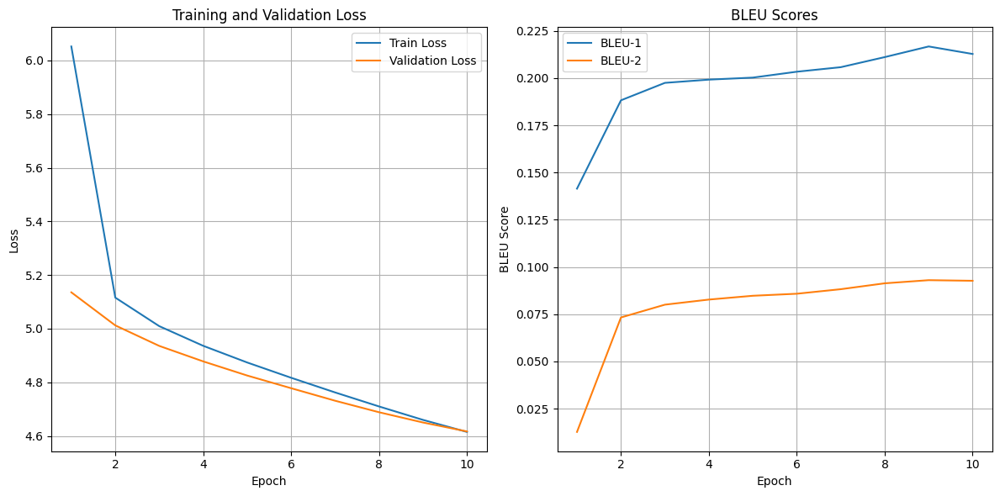

In [ ]:
plot_metrics(train_loss, val_loss, bleu1, bleu2)

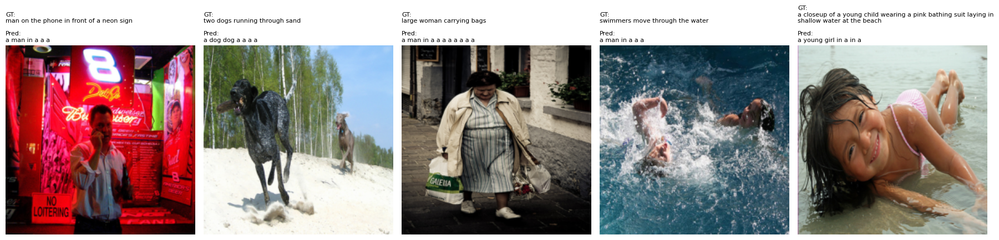

In [ ]:
visualize_predictions(encoder, decoder, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=5)

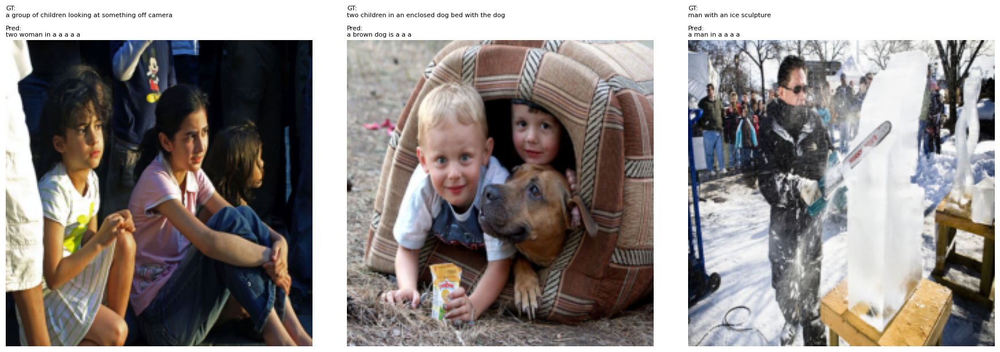

In [ ]:
visualize_predictions(encoder, decoder, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=3)

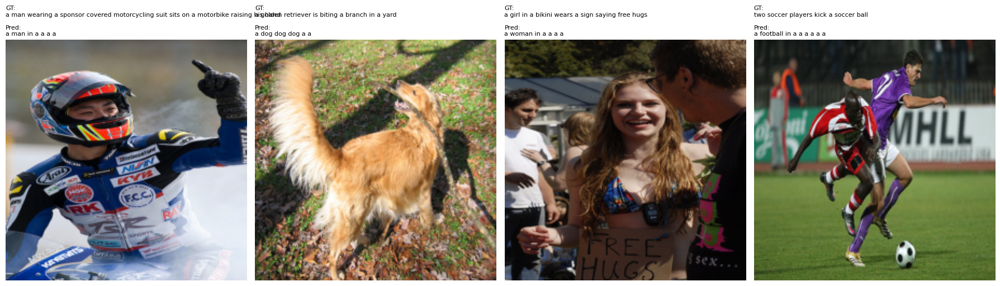

In [ ]:
visualize_predictions(encoder, decoder, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=4)

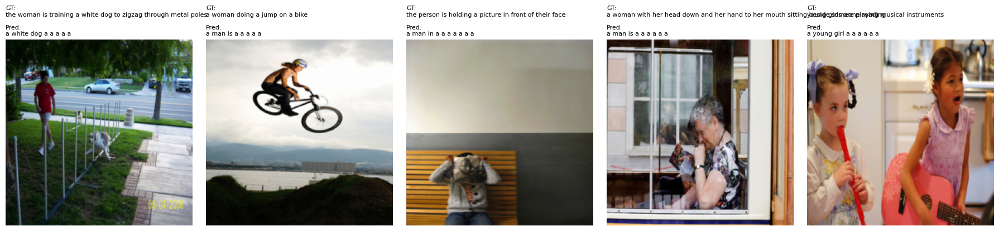

In [ ]:
visualize_predictions(encoder, decoder, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=5)

In [ ]:
bleu1, bleu2 = evaluate_test_data(encoder, decoder, dataloaders['test'], vocab, device, decode_strategy='greedy')

Evaluating on test set using greedy decoding...
Test Set BLEU-1: 0.2111
Test Set BLEU-2: 0.0920


## imp1- bleu

In [ ]:
encoder1 = EncoderCNN(fine_tune_cnn=False).to(device)

decoder1 = DecoderRNN(
    embed_dim=embed_dim,
    decoder_dim=decoder_dim,
    vocab_size=len(vocab),
    dropout=dropout,
    use_attention=False
).to(device)

train_loss, val_loss, bleu1, bleu2 = train_model(
    encoder1, decoder1,
    dataloaders=dataloaders,
    criterion=nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"]),
    optimizer=torch.optim.Adam(list(decoder1.parameters()) + list(encoder1.parameters()), lr=5e-5),
    vocab=vocab,
    device=device,
    teacher_forcing=False,
    early_stopping_metric='bleu',
    decode_strategy='greedy',
    patience=3,
    max_epochs = 10
)

[Epoch 1/10] Train Loss: 5.5460 | Val Loss: 4.8583 | BLEU-1: 0.1518 | BLEU-2: 0.0526
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth
[Epoch 2/10] Train Loss: 4.6667 | Val Loss: 4.4945 | BLEU-1: 0.1643 | BLEU-2: 0.0752
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth
[Epoch 3/10] Train Loss: 4.3373 | Val Loss: 4.2141 | BLEU-1: 0.2598 | BLEU-2: 0.1262
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth
[Epoch 4/10] Train Loss: 4.0942 | Val Loss: 4.0103 | BLEU-1: 0.2827 | BLEU-2: 0.1386
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth
[Epoch 5/10] Train Loss: 3.9174 | Val Loss: 3.8632 | BLEU-1: 0.2750 | BLEU-2: 0.1367
[Epoch 6/10] Train Loss: 3.7862 | Val Loss: 3.7502 | BLEU-1: 0.2861 | BLEU-2: 0.1454
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth
[Epoch 7/10] Train Loss: 3.679

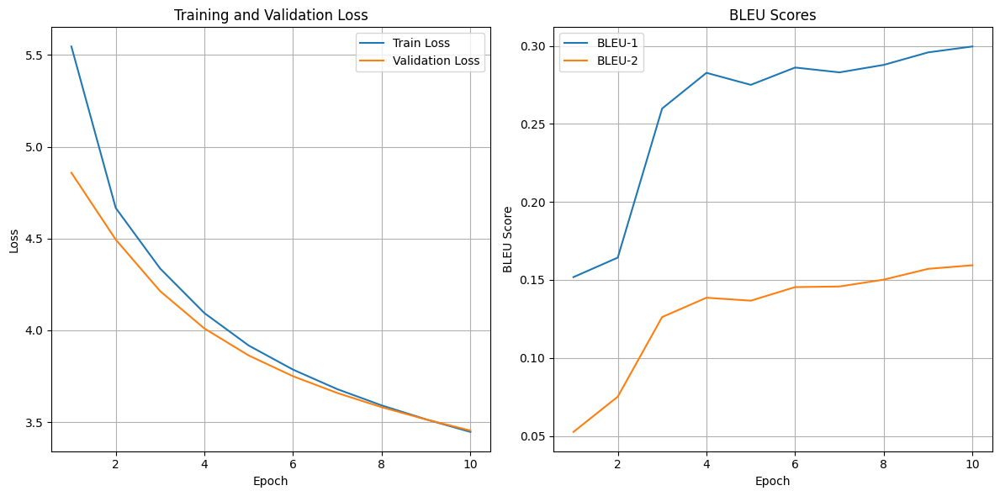

In [ ]:
plot_metrics(train_loss, val_loss, bleu1, bleu2)

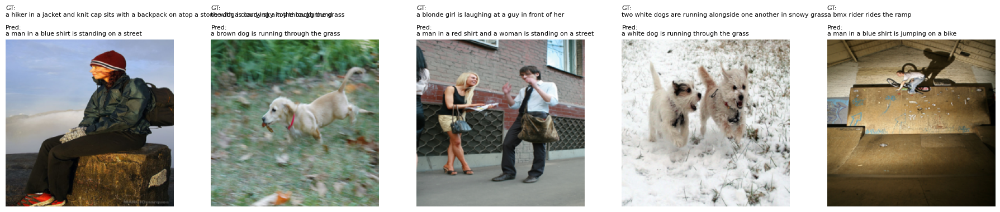

In [ ]:
visualize_predictions(encoder1, decoder1, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=5)

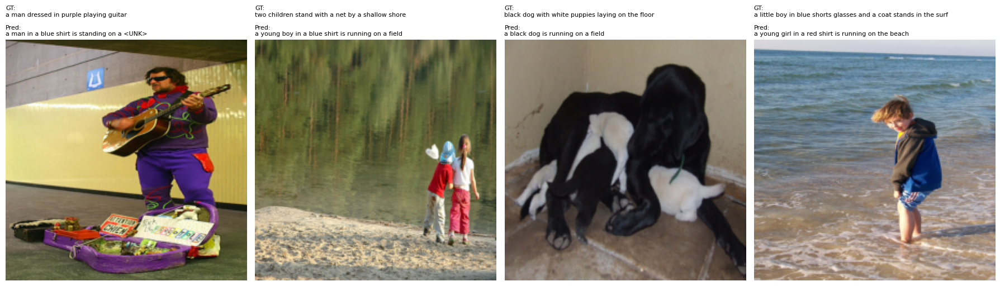

In [ ]:
visualize_predictions(encoder1, decoder1, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=4)

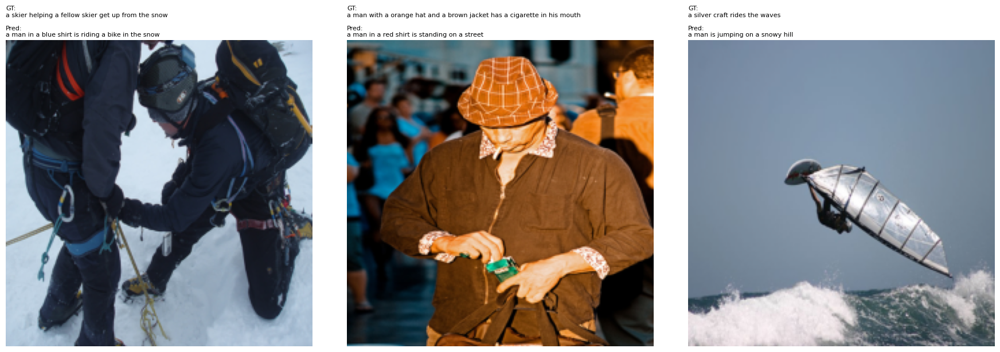

In [ ]:
visualize_predictions(encoder1, decoder1, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=3)

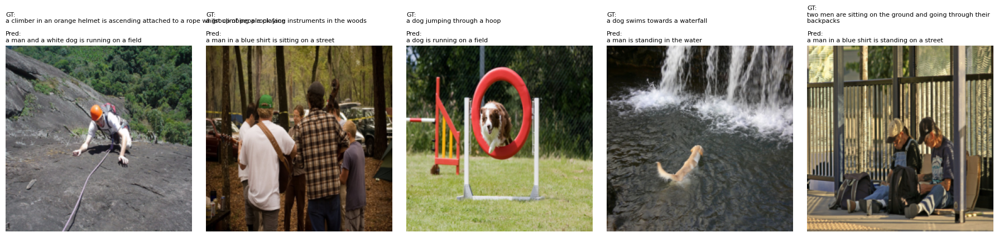

In [ ]:
visualize_predictions(encoder1, decoder1, test_dataset, vocab, device=device, decode_strategy='greedy', num_samples=5)

In [ ]:
bleu1, bleu2 = evaluate_test_data(encoder1, decoder1, dataloaders['test'], vocab, device, decode_strategy='greedy')

Evaluating on test set using greedy decoding...
Test Set BLEU-1: 0.2961
Test Set BLEU-2: 0.1555


## imp2 - beam search & *teacher_forcing*!


In [ ]:
# encoder2 = EncoderCNN(fine_tune_cnn=False).to(device)

# decoder2 = DecoderRNN(
#     embed_dim=embed_dim,
#     decoder_dim=decoder_dim,
#     vocab_size=len(vocab),
#     dropout=dropout,
#     use_attention=False
# ).to(device)

# train_loss, val_loss, bleu1, bleu2 = train_model(
#     encoder2, decoder2,
#     dataloaders=dataloaders,
#     criterion=nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"]),
#     optimizer=torch.optim.Adam(list(decoder2.parameters()) + list(encoder2.parameters()), lr=5e-5),
#     vocab=vocab,
#     device=device,
#     teacher_forcing=True,
#     early_stopping_metric='bleu',
#     decode_strategy='beam',
#     beam_size=2,
#     patience=3,
#     max_epochs = 10
# )


## imp 3- attention

In [ ]:
encoder3 = EncoderCNN(fine_tune_cnn=False).to(device)

decoder3 = DecoderRNN(
    embed_dim=embed_dim,
    decoder_dim=decoder_dim,
    vocab_size=len(vocab),
    dropout=dropout,
    use_attention=True
).to(device)

In [ ]:
print_model_param_counts(encoder3, name="Encoder (ResNet101)")
print_model_param_counts(decoder3, name="Decoder (LSTM)")

Encoder (ResNet101) Parameters:
Total:       42,500,160
Trainable:   0
Frozen:      42,500,160
----------------------------------------
Decoder (LSTM) Parameters:
Total:       12,172,589
Trainable:   12,172,589
Frozen:      0
----------------------------------------


In [ ]:
train_loss, val_loss, bleu1, bleu2 = train_model(
    encoder3, decoder3,
    dataloaders=dataloaders,
    criterion=nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"]),
    optimizer=torch.optim.Adam(list(decoder3.parameters()) + list(encoder3.parameters()), lr=5e-5),
    vocab=vocab,
    device=device,
    teacher_forcing=True,
    early_stopping_metric='bleu',
    decode_strategy='beam',
    beam_size=2,
    patience=3,
    max_epochs = 10
)

Epoch 1 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 1 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 1/10 - Train Loss: 5.8779, Val Loss: 5.1862, BLEU-1: 0.1516, BLEU-2: 0.0620
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 2 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 2 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 2/10 - Train Loss: 5.0258, Val Loss: 5.1883, BLEU-1: 0.1853, BLEU-2: 0.0788
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 3 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 3 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 3/10 - Train Loss: 4.7082, Val Loss: 5.3900, BLEU-1: 0.2065, BLEU-2: 0.0882
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 4 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 4 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 4/10 - Train Loss: 4.4800, Val Loss: 5.6701, BLEU-1: 0.1782, BLEU-2: 0.0782


Epoch 5 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d4e7e67fc40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d4e7e67fc40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 5 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 5/10 - Train Loss: 4.3109, Val Loss: 5.6728, BLEU-1: 0.1873, BLEU-2: 0.0875


Epoch 6 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 6 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 6/10 - Train Loss: 4.1810, Val Loss: 5.6708, BLEU-1: 0.2596, BLEU-2: 0.1242
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 7 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 7 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 7/10 - Train Loss: 4.0756, Val Loss: 5.7455, BLEU-1: 0.2679, BLEU-2: 0.1307
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 8 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 8 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 8/10 - Train Loss: 3.9885, Val Loss: 5.7924, BLEU-1: 0.2759, BLEU-2: 0.1357
Encoder saved to checkpoints/encoder_best.pth
Decoder saved to checkpoints/decoder_best.pth


Epoch 9 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 9 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 9/10 - Train Loss: 3.9122, Val Loss: 5.8765, BLEU-1: 0.2728, BLEU-2: 0.1336


Epoch 10 [Train]:   0%|          | 0/540 [00:00<?, ?it/s]

Epoch 10 [Validation]:   0%|          | 0/68 [00:00<?, ?it/s]

Epoch 10/10 - Train Loss: 3.8461, Val Loss: 5.9431, BLEU-1: 0.2608, BLEU-2: 0.1288


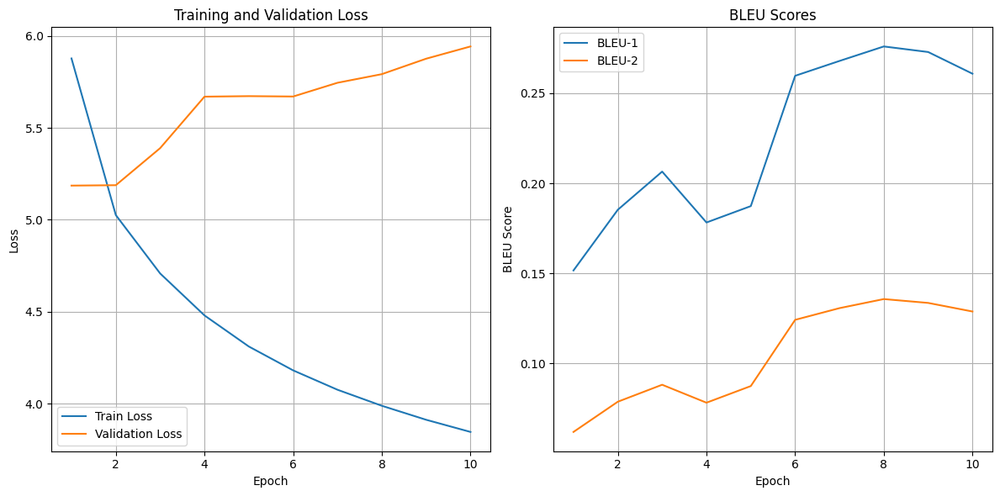

In [ ]:
plot_metrics(train_loss, val_loss, bleu1, bleu2)

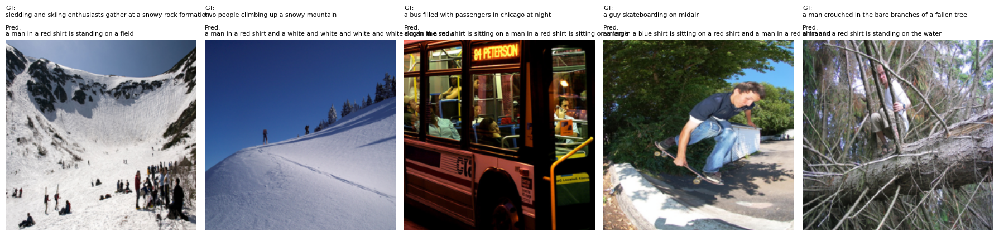

In [ ]:
visualize_predictions(encoder3, decoder3, test_dataset, vocab, device=device, decode_strategy='beam', beam_size=2, num_samples=5)

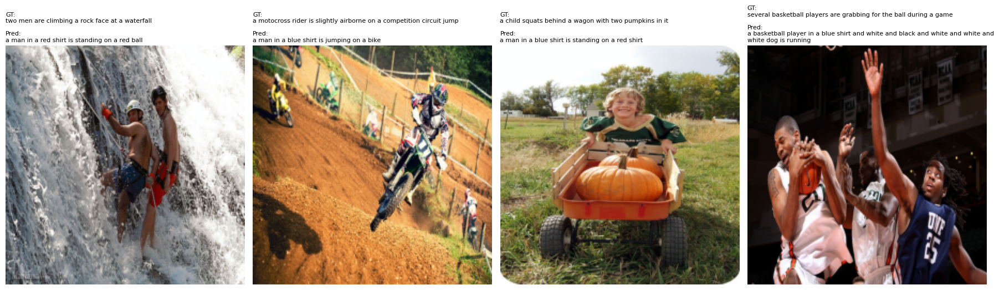

In [ ]:
visualize_predictions(encoder3, decoder3, test_dataset, vocab, device=device, decode_strategy='beam', beam_size=2, num_samples=4)

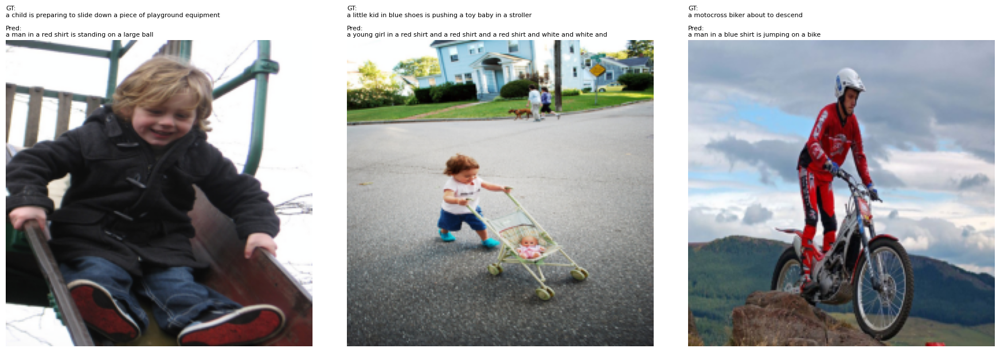

In [ ]:
visualize_predictions(encoder3, decoder3, test_dataset, vocab, device=device, decode_strategy='beam', beam_size=2, num_samples=3)

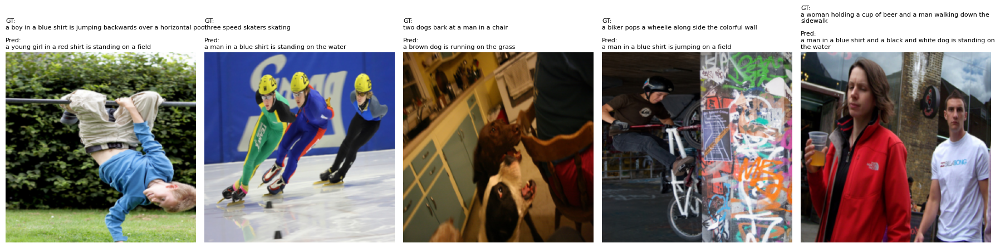

In [ ]:
visualize_predictions(encoder3, decoder3, test_dataset, vocab, device=device, decode_strategy='beam', beam_size=2, num_samples=5)

In [ ]:
bleu1, bleu2 = evaluate_test_data(encoder3, decoder3, dataloaders['test'], vocab, device, decode_strategy='beam', beam_size=2)

Evaluating on test set using beam decoding...
Test Set BLEU-1: 0.2611
Test Set BLEU-2: 0.1293


In [ ]:
def visualize_attention_map(image_tensor, encoder, decoder, vocab, device, max_length=20):
    """
    Visualizes attention maps over image for each generated word.
    image_tensor: (3, H, W) — raw image (normalized)
    """
    encoder.eval()
    decoder.eval()

    assert decoder.use_attention, "Decoder must have use_attention=True to visualize attention."

    # Original image shape before normalization for resizing the attention map
    original_image_shape = image_tensor.shape[1:] # (H, W)

    image_input = image_tensor.unsqueeze(0).to(device)  # (1, 3, H, W)
    with torch.no_grad():
        encoder_out = encoder(image_input)  # (1, 2048, 14, 14)
        # The EncoderCNN outputs 14x14 spatial features by default.
        # Reshape to (1, num_pixels, encoder_dim) where num_pixels = 14*14
        encoder_out = encoder_out.view(1, decoder.encoder_dim, -1).permute(0, 2, 1) # (1, 196, 2048)
        num_pixels = encoder_out.size(1)
        # Ensure encoder_out has the correct encoder_dim
        # encoder_out = encoder_out.expand(1, num_pixels, decoder.encoder_dim) # This expand is not needed here

        # Initial hidden and cell states are based on the mean of the encoder output
        h, c = decoder.init_hidden_state(encoder_out.mean(dim=1)) # mean over pixels (1, 2048)

        # Start decoding
        word_ids = [vocab.stoi["<START>"]]
        alphas_list = []
        generated_words = []

        # We need to store the first alpha as well for the first word prediction
        # The first attention calculation happens before the first word is predicted (based on START token)
        # However, the attention map is usually visualized *for* the predicted word, showing where the model looked to predict *that* word.
        # So, we'll store alpha for each *predicted* word.

        # Initial inputs for the first step
        prev_word = torch.LongTensor([word_ids[-1]]).to(device) # <START> token
        embedding = decoder.embedding(prev_word) # (1, embed_dim)

        for t in range(max_length):
            # Calculate attention for the *current* step (using previous hidden state)
            attn_weighted, alpha = decoder.attention(encoder_out, h) # encoder_out is (1, num_pixels, 2048), h is (1, decoder_dim)

            # Store the alpha map
            alphas_list.append(alpha.view(14, 14).cpu().numpy()) # store attention shape (14, 14)

            # Apply gate
            gate = decoder.sigmoid(decoder.f_beta(h))
            attn_weighted = gate * attn_weighted # (1, encoder_dim)

            # Prepare LSTM input: [embedding, attention_weighted_encoding]
            lstm_input = torch.cat([embedding, attn_weighted], dim=1) # (1, embed_dim + encoder_dim)

            # Perform LSTM step
            h, c = decoder.decode_step(lstm_input, (h, c)) # h, c are (1, decoder_dim)

            # Predict the next word
            scores = decoder.fc(h) # (1, vocab_size)
            predicted_id = scores.argmax(dim=1).item()
            word_ids.append(predicted_id)

            word = vocab.itos[predicted_id]

            # If it's the <END> token, we stop. The attention map for <END> isn't typically visualized.
            if word == "<END>":
                # Remove the last alpha which corresponds to predicting <END>
                alphas_list.pop()
                break

            generated_words.append(word)

            # Prepare embedding for the next step
            embedding = decoder.embedding(torch.LongTensor([predicted_id]).to(device)) # (1, embed_dim)


    # ---------- Plot ----------
    # Unnormalize the image for display
    image = image_tensor.permute(1, 2, 0).cpu().numpy()
    image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # unnormalize
    image = np.clip(image, 0, 1)

    num_words_to_plot = len(generated_words) # Only plot for generated words (excluding <END>)
    # Add 1 for the original image plot
    fig = plt.figure(figsize=(num_words_to_plot * 3, 6)) # Adjust figure size based on number of words


    # original image subplot
    ax = fig.add_subplot(2, num_words_to_plot + 1, 1)
    ax.imshow(image)
    ax.axis('off')
    ax.set_title("Input Image")

    # Plot attention maps for each generated word
    for t in range(num_words_to_plot):
        ax = fig.add_subplot(2, num_words_to_plot + 1, t + 2) # Position the attention map

        alpha = alphas_list[t] # This alpha corresponds to the attention for predicting generated_words[t]

        # Resize the alpha map to match the original image dimensions
        alpha_img = Image.fromarray(alpha * 255).resize(original_image_shape[::-1], Image.BICUBIC) # Resize takes (width, height)
        alpha_resized = np.array(alpha_img) / 255.0 # Convert back to [0, 1]

        # Create a grayscale heatmap from the resized alpha
        # Ensure heatmap is RGB to mix with color image
        heatmap = cm.Greys(alpha_resized)[:, :, :3] # Get RGB channels

        # Overlay the heatmap on the original image
        # The heatmap and image must have the same spatial dimensions for this operation
        overlay = 0.6 * image + 0.4 * heatmap
        ax.imshow(overlay)
        ax.set_title(generated_words[t])
        ax.axis('off')

    plt.tight_layout()
    plt.show()

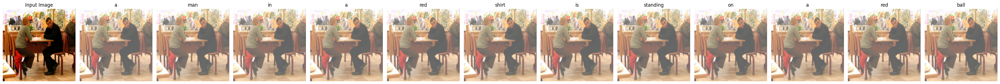

In [ ]:
sample_index = random.randint(0, len(test_dataset) - 1)
sample_image, sample_caption_tensor = test_dataset[sample_index]

visualize_attention_map(sample_image, encoder3, decoder3, vocab, device)